In [15]:
import os
import csv
import subprocess
import array
import random
import pandas as pd
import numpy as np
from pyAudioAnalysis import audioSegmentation as aS
from pyAudioAnalysis import audioTrainTest as aT
from itertools import groupby
from operator import itemgetter
from IPython.display import display, Audio
from pydub import AudioSegment
from pydub.utils import get_array_type
import matplotlib.pyplot as plt
import shutil
import timeit
%matplotlib inline

os.chdir('/Volumes/McLaughlin-6TB-1/Dropbox/aapb-hipstas/Model_training_clips')

In [ ]:
##Assembling UBM files

os.chdir('/Volumes/McLaughlin-6TB-1/Dropbox/aapb-hipstas/Model_training_clips')

try: os.mkdir('UBM')
except: pass

ubm_dir="/Volumes/U/AAPB_Corpus_May_2017/test_set_616_clips"
ubm_files=[item for item in os.listdir(ubm_dir) if ("Baldwin, James" not in item)&('16000.wav' in item)]
ubm_files=random.sample(ubm_files,2)
for filename in ubm_files:
    shutil.copy(os.path.join(ubm_dir,filename),'UBM')

    
ubm_dir="/Volumes/McLaugh 5/PennSound_UBM_Clips/PennSound_UBM_for_Creeley_full_clips"
ubm_files=[item for item in os.listdir(ubm_dir) if ("Baldwin, James" not in item)&('.wav' in item)]
ubm_files=random.sample(ubm_files,2)
for filename in ubm_files:
    shutil.copy(os.path.join(ubm_dir,filename),'UBM')


for filename in ubm_files:
    shutil.copy(os.path.join(ubm_dir,filename),'UBM')

In [ ]:

## Train Model
import timeit
tic=timeit.default_timer()
#print(timeit.default_timer() - tic)


os.chdir('/Volumes/McLaughlin-6TB-1/Dropbox/aapb-hipstas/Model_training_clips')


aT.featureAndTrain(['UBM','Baldwin, James'], 1.0, 1.0, aT.shortTermWindow, aT.shortTermStep, "svm", "svm_Baldwin_UBM_564x2s", False)
print("done")
print(timeit.default_timer() - tic)
tic=timeit.default_timer()
aT.featureAndTrain(['UBM','Baldwin, James'], 1.0, 1.0, aT.shortTermWindow, aT.shortTermStep, "gradientboosting", "gradientboosting_Baldwin_UBM_564x2s", False)
print("done")
print(timeit.default_timer() - tic)
tic=timeit.default_timer()
aT.featureAndTrain(['UBM','Baldwin, James'], 1.0, 1.0, aT.shortTermWindow, aT.shortTermStep, "extratrees", "extratrees_Baldwin_UBM_564x2s", False)
print("done")
print(timeit.default_timer() - tic)
tic=timeit.default_timer()
aT.featureAndTrain(['UBM','Baldwin, James'], 1.0, 1.0, aT.shortTermWindow, aT.shortTermStep, "randomforest", "randomforest_Baldwin_UBM_564x2s", False)
print("done")
print(timeit.default_timer() - tic)
tic=timeit.default_timer()
aT.featureAndTrain(['UBM','Baldwin, James'], 1.0, 1.0, aT.shortTermWindow, aT.shortTermStep, "knn", "knn_Baldwin_UBM_564x2s", False)
print("done")
print(timeit.default_timer() - tic)


In [43]:
# Takes list of 1-second segments classified as speaker (1.0) or 
# non-speaker (0.0) and returns list of 2-tuples specifying speaker ranges.
# Add 1 to 2nd value in each 2-tuple for inclusive time span.
def seconds_list_to_ranges(seconds_list): 
    ranges = []                
    for k, g in groupby(enumerate(seconds_list), lambda (i,x):i-x):
        group = map(itemgetter(1), g)
        ranges.append((group[0], group[-1]))
    return ranges


# Displays specified audio segment in Jupyter window using IPython.display
def display_clip(wav_path,start_time,end_time):
    track_data = AudioSegment.from_wav(file=wav_path)
    track_data = track_data.set_channels(1)
    bit_depth = track_data.sample_width * 8
    clip_data = track_data[int(1000*start_time):int(1000*end_time)]
    array_type = get_array_type(bit_depth)
    numeric_array = array.array(array_type, clip_data._data)
    display(Audio(numeric_array, rate=track_data.frame_rate))

# Classifies audio at 1-second resolution, plots results if speaker found, 
# and returns speaker ranges as list of 2-tuples.
# Add 1 to 2nd value in each 2-tuple for inclusive time span.




def find_speaker(audio_path,classifier_model_path):
    classifier_model_name = classifier_model_path.split('/')[-1]
    classifier_model_type = classifier_model_name.split('_')[0].lower() # assuming model file begins svm_etc
    
    buffer_secs=0
    is_mp3=False
    if audio_path.lower()[-4:] in ['.mp3','.mp4','.wav']:    # Creates a temporary WAV
        is_mp3=True                        # if input is MP3
        random.seed(audio_path)
        wav_path='/var/tmp/'+str(random.random())+'_temp.wav' # Filename for temp WAV is a random float
        subprocess.call(['ffmpeg', '-i', audio_path, '-y', '-ar', '16000', '-ac', '1', '-af', "volume=0.99,highpass=f=150, lowpass=f=5000",  wav_path]) # '-y' option overwrites existing file if present
    else:
        wav_path=audio_path
    print(wav_path)
    output, classesAll, acc, CM = aS.mtFileClassification(wav_path, classifier_model_path, classifier_model_type) #or replace with 'svm' etc. as needed
    output = list(output)
    counter=0
    speaker_secs=[]
    for value in output:
        if value>0.0:
            speaker_secs.append(counter)
        counter+=1
    speaker_ranges=seconds_list_to_ranges(speaker_secs)
    if len(speaker_ranges)>0:
        print speaker_ranges
        print '\n'
        pd.Series(output).plot()
        plt.show()
    for pair in speaker_ranges:
        print pair
        display_clip(wav_path,pair[0],pair[1]+1)
    if is_mp3==True:
        os.remove(wav_path)
    outputfile=audio_path.split('/')[-1][:-4]+"_"+classifier_model_name+".csv"
    with open(outputfile, 'w') as csv_fo:
        speaker_ranges_expanded=[(start,1,end-start+1) for start,end in speaker_ranges]
        csv_writer = csv.writer(csv_fo)
        csv_writer.writerows(speaker_ranges_expanded)
    print(outputfile)
    return speaker_ranges_expanded

In [64]:
yt_path="/Volumes/McLaughlin-6TB-1/Dropbox/aapb-hipstas/YouTube_corpus/Baldwin, James"
test_files=[os.path.join(yt_path,item) for item in os.listdir(yt_path) if ".DS_Store" not in item]
test_files

['/Volumes/McLaughlin-6TB-1/Dropbox/aapb-hipstas/YouTube_corpus/Baldwin, James/I Am Not Your Negro - Official Trailer-rNUYdgIyaPM.wav',
 '/Volumes/McLaughlin-6TB-1/Dropbox/aapb-hipstas/YouTube_corpus/Baldwin, James/JAMES BALDWIN - Interview (Florida Forum, Miami)~~1963-FpRziHGxeEU.wav',
 '/Volumes/McLaughlin-6TB-1/Dropbox/aapb-hipstas/YouTube_corpus/Baldwin, James/James Baldwin - interview - pt. 1-xb_NbdeE2zU.wav',
 '/Volumes/McLaughlin-6TB-1/Dropbox/aapb-hipstas/YouTube_corpus/Baldwin, James/James Baldwin Speaks on Racism-9fZ8WqPuhRE.wav',
 "/Volumes/McLaughlin-6TB-1/Dropbox/aapb-hipstas/YouTube_corpus/Baldwin, James/James Baldwin Speech - 'Living and Growing in a White World (Part One)-ocj5x-jE8aE.wav"]

In [65]:
classifier_model_paths=["/Volumes/McLaughlin-6TB-1/Dropbox/aapb-hipstas/Model_training_clips/extratrees_Baldwin_UBM_564x2s",\
"/Volumes/McLaughlin-6TB-1/Dropbox/aapb-hipstas/Model_training_clips/gradientboosting_Baldwin_UBM_564x2s",\
"/Volumes/McLaughlin-6TB-1/Dropbox/aapb-hipstas/Model_training_clips/knn_Baldwin_UBM_564x2s"]

#classifier_model_path="/Volumes/McLaughlin-6TB-1/Dropbox/aapb-hipstas/Model_training_clips/randomforest_Baldwin_UBM_564x2s",\

classifier_model_paths=["/Volumes/McLaughlin-6TB-1/Dropbox/aapb-hipstas/Model_training_clips/svm_Baldwin_UBM_564x2s"]


#test_files=[\
#'/Users/mclaugh/Desktop/WGBH_Youtube_tests/Malcolm X - Debate with James Baldwin - September 5, 1963--JIp9_IIV3s.mp4',\
#'/Volumes/McLaughlin-6TB-1/Extended_Corpus/James_Baldwin/cpb-aacip-75-48sbchq4.h264.mp4',\
#'/Users/mclaugh/Desktop/WGBH_Youtube_tests/Julia Child makes an omelet-RThnq3-d6PY.wav',\
#'/Volumes/McLaughlin-6TB-1/Extended_Corpus/James_Baldwin/cpb-aacip-15-719kdkmx.h264.mp4',\
#'/Volumes/McLaughlin-6TB-1/Extended_Corpus/James_Baldwin/cpb-aacip-28-n872v2ct06__PRA_AAPP_BB0838_Baldwin_at_the_Masonic_Temple_.mp3'\
#]

/var/tmp/0.344880119816_temp.wav
[(0, 24), (35, 42), (45, 46), (56, 62), (75, 84), (87, 88), (96, 106), (109, 113), (120, 136)]




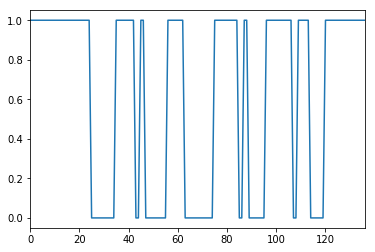

(0, 24)


(35, 42)


(45, 46)


(56, 62)


(75, 84)


(87, 88)


(96, 106)


(109, 113)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


/var/tmp/0.557112845819_temp.wav
[(1, 25), (29, 34), (111, 113), (125, 185), (191, 199), (205, 235), (240, 251), (260, 329), (332, 340), (343, 344), (348, 353), (360, 368), (371, 375), (383, 384), (388, 413), (418, 431), (434, 435), (438, 448), (454, 457), (461, 462), (477, 488), (492, 497), (501, 517), (531, 584), (589, 593), (596, 625), (634, 639), (642, 661), (665, 700), (703, 713), (716, 737), (743, 746), (763, 773), (777, 784), (789, 873), (883, 891), (894, 907), (910, 973), (988, 989), (995, 1000), (1003, 1077), (1080, 1083), (1086, 1087), (1091, 1172), (1175, 1181), (1184, 1214), (1221, 1289), (1294, 1329), (1332, 1347), (1350, 1370), (1401, 1465), (1470, 1471), (1497, 1504), (1511, 1550)]




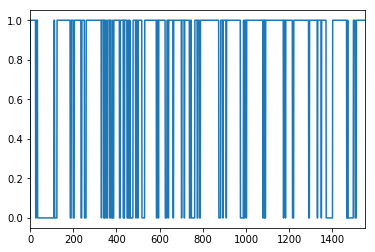

(1, 25)


(29, 34)


(111, 113)


(125, 185)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(191, 199)


(205, 235)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(240, 251)


(260, 329)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(332, 340)


(343, 344)


(348, 353)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(418, 431)


(434, 435)


(438, 448)


(454, 457)


(461, 462)


(477, 488)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(589, 593)


(596, 625)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(634, 639)


(642, 661)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(665, 700)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(703, 713)


(716, 737)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(743, 746)


(763, 773)


(777, 784)


(789, 873)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(883, 891)


(894, 907)


(910, 973)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(1080, 1083)


(1086, 1087)


(1091, 1172)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(1175, 1181)


(1184, 1214)


(1221, 1289)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(1294, 1329)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(1332, 1347)


(1350, 1370)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(1401, 1465)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(1470, 1471)


(1497, 1504)


(1511, 1550)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


/var/tmp/0.367864349641_temp.wav
[(0, 539)]




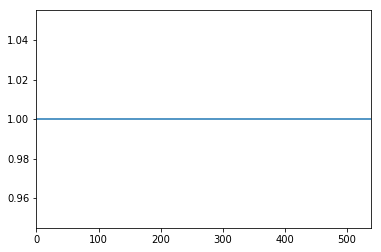

(0, 539)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


/var/tmp/0.0130565884281_temp.wav
[(1, 22), (25, 29), (44, 50), (60, 60)]




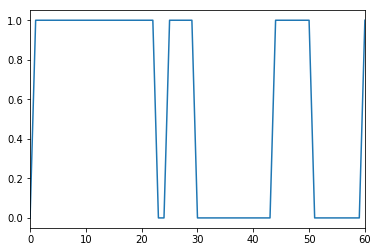

(1, 22)


(25, 29)


(44, 50)


(60, 60)


/var/tmp/0.56035711225_temp.wav
[(0, 483), (486, 615), (618, 859)]




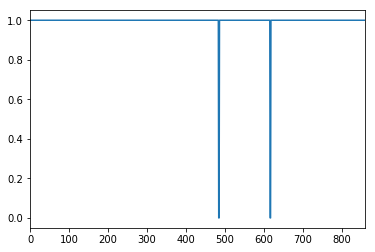

(0, 483)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(486, 615)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


(618, 859)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [66]:
# Example speaker search
import timeit
tic=timeit.default_timer()
#print(timeit.default_timer() - tic)

#audio_path=test_files[2]

for classifier_model_path in classifier_model_paths:
    for audio_path in test_files:
        dd=find_speaker(audio_path,classifier_model_path)


In [67]:
print(timeit.default_timer() - tic)

201.457891941
